In [1]:
import datetime
import numpy as np
import time
import torch
import torch.backends.cudnn as cudnn
import json



from timm.data import Mixup
from timm.models import create_model
from timm.loss import LabelSmoothingCrossEntropy, SoftTargetCrossEntropy
from timm.scheduler import create_scheduler

from optimizer import build_optimizer
from timm.utils import get_state_dict, ModelEma

from datasets import build_dataset, build_transform, split_dataset, count_samples_per_class
from engine import train_one_epoch, evaluate, NativeScalerAccum
from losses import DistillationLoss
from samplers import RASampler

import pkg_resources
from torchinfo import summary

# The following code is adapted for PyTorch version 2.1.0 and above.
# This method may not work for future versions.
torch_version = pkg_resources.get_distribution("torch").version
if torch_version >= '2.1.0':
    import torch._dynamo

    torch._dynamo.config.automatic_dynamic_shapes = False

import transnext

import argparse
import utils
from pathlib import Path

c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\transnext_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


swattention package found, loading CUDA version of Aggregated Attention


In [2]:
from argparse import Namespace

args = Namespace(
    fp32_resume=False,
    batch_size=128,
    epochs=40,
    update_freq=1,
    config="./configs/transnext_small.py",
    model="transnext_small",
    input_size=224,
    pretrain_size=None,
    fixed_pool_size=None,
    drop=0.0,
    drop_path=0.1,
    opt="adamw",
    opt_eps=1e-8,
    opt_betas=None,
    clip_grad=None,
    momentum=0.9,
    weight_decay=0.05,
    sched="cosine",
    lr=1e-3,
    lr_noise=None,
    lr_noise_pct=0.67,
    lr_noise_std=1.0,
    warmup_lr=1e-6,
    min_lr=1e-5,
    decay_epochs=30,
    warmup_epochs=5,
    cooldown_epochs=10,
    patience_epochs=10,
    decay_rate=0.1,
    color_jitter=0.4,
    aa="rand-m9-mstd0.5-inc1",
    smoothing=0.1,
    train_interpolation="bicubic",
    repeated_aug=True,
    reprob=0.25,
    remode="pixel",
    recount=1,
    resplit=False,
    mixup=0.8,
    cutmix=1.0,
    cutmix_minmax=None,
    mixup_prob=1.0,
    mixup_switch_prob=0.5,
    mixup_mode="batch",
    finetune="",
    data_path="./Dataset/Food101",
    data_set="Food101",
    use_mcloader=False,
    inat_category="name",
    output_dir="./output_dir",
    device="cuda",
    seed=0,
    resume="",
    start_epoch=0,
    eval=False,
    dist_eval=False,
    num_workers=14,
    pin_mem=True,
    compile_model=False,
    cache_size_limit=128,
    world_size=1,
    dist_url="env://"
)


In [3]:
args.finetune = 'models/small_imnet_finetuned/transnext_small_384_1k_ft_1k.pth'
args.pretrain_size = 384
args.batch_size = 32
args.data_set = "Food101"
args.data_path = "Dataset/Food101"
args.input_size = 128
device = torch.device(args.device)
 # fix the seed for reproducibility
seed = args.seed + utils.get_rank()
torch.manual_seed(seed)
np.random.seed(seed)
Freeze_and_train_classifer_only = False
cudnn.benchmark = True


In [4]:
dataset_train, args.nb_classes = build_dataset(is_train=True, args=args)
dataset_val, _ = build_dataset(is_train=False, args=args)


In [5]:
print(f"Number of training samples: {len(dataset_train)}")
print(f"Number of validation samples: {len(dataset_val)}")
print(f"Number of classes: {args.nb_classes}")

Number of training samples: 75750
Number of validation samples: 25250
Number of classes: 101


In [6]:
sampler_train = torch.utils.data.RandomSampler(dataset_train)
sampler_val = torch.utils.data.SequentialSampler(dataset_val)

In [7]:
data_loader_train = torch.utils.data.DataLoader(
    dataset_train, sampler=sampler_train,
    batch_size=args.batch_size,
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
    drop_last=True,
)
data_loader_val = torch.utils.data.DataLoader(
    dataset_val, sampler=sampler_val,
    batch_size=int(1.5 * args.batch_size),
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
    drop_last=False
)

In [18]:
mixup_fn = None
mixup_active = args.mixup > 0 or args.cutmix > 0. or args.cutmix_minmax is not None
if mixup_active:
    mixup_fn = Mixup(
        mixup_alpha=args.mixup, cutmix_alpha=args.cutmix, cutmix_minmax=args.cutmix_minmax,
        prob=args.mixup_prob, switch_prob=args.mixup_switch_prob, mode=args.mixup_mode,
        label_smoothing=args.smoothing, num_classes=args.nb_classes)


In [27]:
import matplotlib.pyplot as plt
import torchvision

def denormalize(tensor, mean, std):
    """
    Denormalize a tensor image with mean and standard deviation.
    """
    mean = torch.tensor(mean).reshape(1, -1, 1, 1)
    std = torch.tensor(std).reshape(1, -1, 1, 1)
    tensor = tensor * std + mean
    return tensor

def show_images(images, labels, class_names, title=None):
    """
    Display a grid of images with labels.
    """
    images = images.cpu()
    labels = labels.cpu()
    images_denorm = denormalize(images, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    grid_img = torchvision.utils.make_grid(images_denorm, nrow=4)
    plt.figure(figsize=(12, 8))
    plt.imshow(grid_img.permute(1, 2, 0))
    if title:
        plt.title(title)
    else:
        plt.title([class_names[label] for label in labels])
    plt.axis('off')
    plt.show()

# Get class names from your dataset
class_names = dataset_train.classes  # This should be a list of class names

# Get a batch of training data
data_iter = iter(data_loader_train)
images, labels = next(data_iter)

# Visualize original images
show_images(images, labels, class_names, title="Original Images")


In [224]:
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# Define a simple transform to convert images to tensors
simple_transform = transforms.Compose([
    transforms.Resize((args.input_size, args.input_size)),  # Ensure all images are resized to the same size
    transforms.ToTensor()
])

# Load the dataset without any augmentations
dataset_train_raw = datasets.Food101(args.data_path, split='train', transform=simple_transform)

# Create a DataLoader
data_loader_train_raw = torch.utils.data.DataLoader(
    dataset_train_raw,
    batch_size=8,  # Adjust the batch size as needed
    shuffle=True,
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
    drop_last=True,
)

# Get a batch of images
images_raw, labels_raw = next(iter(data_loader_train_raw))

# Visualize the images
def show_images(images, labels, classes, title):
    fig, axes = plt.subplots(4, 2, figsize=(8, 16))  # 4 rows, 2 columns
    axes = axes.flatten()
    for img, lbl, ax in zip(images, labels, axes):
        img = img.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C)
        img = img.numpy()
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]
        ax.imshow(img)
        ax.set_title(classes[lbl])
        ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Get class names
class_names = dataset_train_raw.classes

# Show the images
show_images(images_raw, labels_raw, class_names, title="Original Images")


KeyboardInterrupt: 

In [173]:
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.data import create_transform

def build_transform(is_train, args):
    resize_im = args.input_size > 32
    if is_train:
        # this should always dispatch to transforms_imagenet_train
        transform = create_transform(
            input_size=args.input_size,
            is_training=True,
            color_jitter=args.color_jitter,
            auto_augment=args.aa,
            interpolation=args.train_interpolation,
            re_prob=args.reprob,
            re_mode=args.remode,
            re_count=args.recount,
        )
        if not resize_im:
            # replace RandomResizedCropAndInterpolation with
            # RandomCrop
            transform.transforms[0] = transforms.RandomCrop(
                args.input_size, padding=4)
        return transform

    t = []
    if resize_im:
        # warping (no cropping) when evaluated at 384 or larger
        if args.input_size >= 384:
            t.append(
            transforms.Resize((args.input_size, args.input_size),
                            interpolation=transforms.InterpolationMode.BICUBIC),
        )
            print(f"Warping {args.input_size} size input images...")
        else:
            args.crop_pct = 224 / 256
            size = int(args.input_size / args.crop_pct)
            t.append(
                transforms.Resize(size, interpolation=3),  # to maintain same ratio w.r.t. 224 images
            )
            t.append(transforms.CenterCrop(args.input_size))

    t.append(transforms.ToTensor())
    t.append(transforms.Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD))
    return transforms.Compose(t)


In [ ]:

dataset_train_transformed = datasets.Food101(args.data_path, split='train', transform=build_transform(True, args))

# Create a DataLoader
data_loader_train_transformed = torch.utils.data.DataLoader(
    dataset_train_transformed,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=args.pin_mem,
    drop_last=True,
)




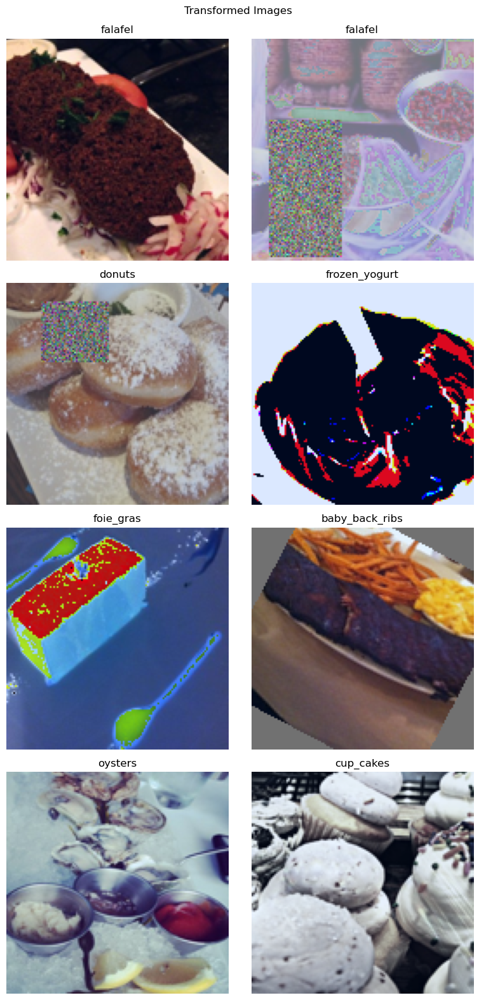

In [230]:
# Get a batch of images
images_transformed, labels_transformed = next(iter(data_loader_train_transformed))
def show_images(images, labels, classes, title):
    fig, axes = plt.subplots(4, 2, figsize=(8, 16))  # 4 rows, 2 columns
    axes = axes.flatten()
    for img, lbl, ax in zip(images, labels, axes):
        img = img.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C)
        img = img.numpy()
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]
        ax.imshow(img)
        ax.set_title(classes[lbl])
        ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
# Show the images
show_images(images_transformed, labels_transformed, class_names, title="Transformed Images \n")

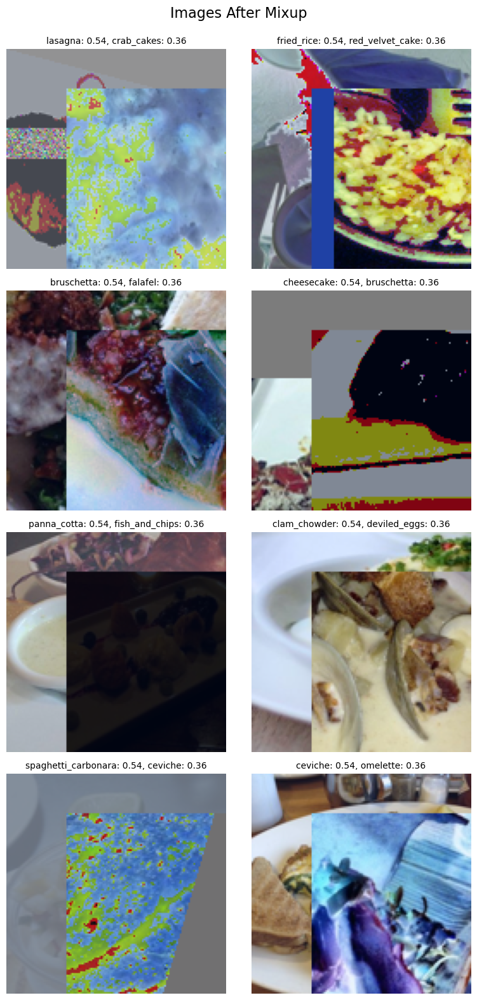

In [229]:
# Ensure `Mixup` is defined as before
if mixup_fn is None:
    mixup_fn = Mixup(
        mixup_alpha=args.mixup, cutmix_alpha=args.cutmix, cutmix_minmax=args.cutmix_minmax,
        prob=args.mixup_prob, switch_prob=args.mixup_switch_prob, mode=args.mixup_mode,
        label_smoothing=args.smoothing, num_classes=args.nb_classes
    )

# Apply Mixup to the batch
images_mixup, labels_mixup = mixup_fn(images_transformed, labels_transformed)

# Ensure `class_names` contains all possible class names
class_names = dataset_train_raw.classes

# Visualization Function
def show_images_mixup(images, labels, classes, title):
    unique_indices = set()  # Track unique images
    fig, axes = plt.subplots(4, 2, figsize=(8, 16))  # 4 rows, 2 columns
    axes = axes.flatten()

    for img, lbl, ax in zip(images, labels, axes):
        if id(img) in unique_indices:
            continue  # Skip if the image has already been shown

        unique_indices.add(id(img))  # Add image ID to the set
        img = img.permute(1, 2, 0).cpu()  # Convert to (H, W, C) and move to CPU
        img = img.numpy()
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]
        ax.imshow(img)

        # Handle mixed labels
        lbl_np = lbl.cpu().numpy()
        top_indices = lbl_np.argsort()[-2:][::-1]  # Get the top two class indices
        label_str = ", ".join(
            f"{classes[idx]}: {lbl_np[idx]:.2f}" for idx in top_indices if idx < len(classes)
        )

        ax.set_title(label_str, fontsize=10)
        ax.axis('off')

    # Remove any empty axes (if fewer than 8 images)
    for ax in axes[len(images):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Show images after Mixup
show_images_mixup(images_mixup, labels_mixup, class_names, title="Images After Mixup\n")


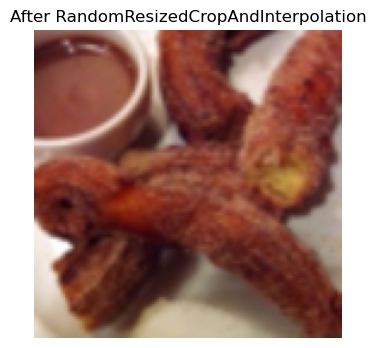

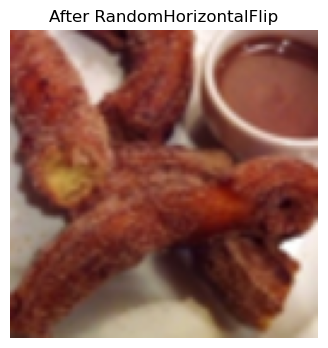

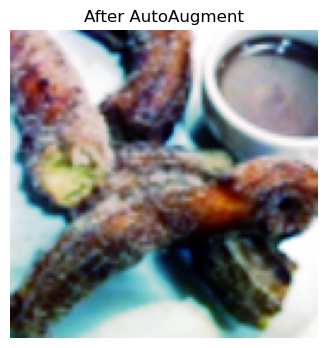

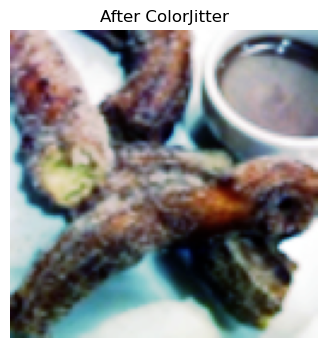

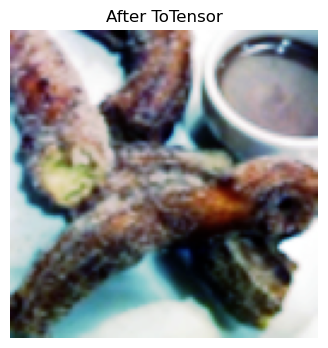

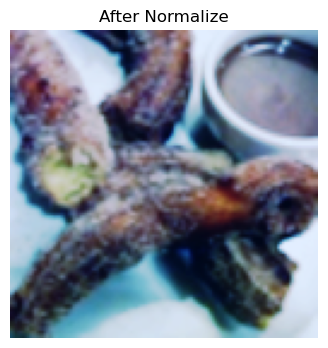

In [44]:
from torchvision.transforms import Compose, RandomHorizontalFlip, ColorJitter, ToTensor, Normalize
from timm.data.transforms import RandomResizedCropAndInterpolation
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from PIL import Image
import matplotlib.pyplot as plt
import torch

# Define individual transformations
transform_list = [
    RandomResizedCropAndInterpolation(args.input_size, interpolation=args.train_interpolation),
    RandomHorizontalFlip(),
    transforms.AutoAugment(policy=transforms.AutoAugmentPolicy.IMAGENET),
    ColorJitter(brightness=args.color_jitter, contrast=args.color_jitter, saturation=args.color_jitter, hue=0),
    ToTensor(),
    Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD),
]

# Create a list to hold the intermediate images
intermediate_images = []

# Function to apply transformations step by step
def apply_transformations_step_by_step(image):
    global intermediate_images
    img = image
    for idx, transform in enumerate(transform_list):
        img = transform(img)
        if isinstance(img, torch.Tensor):
            img_to_show = img.clone()
            if img_to_show.dim() == 3:
                img_to_show = img_to_show.unsqueeze(0)
            intermediate_images.append((img_to_show, f"After {transform.__class__.__name__}"))
        else:
            # For PIL images
            img_to_show = ToTensor()(img).unsqueeze(0)
            intermediate_images.append((img_to_show, f"After {transform.__class__.__name__}"))
    return img

# Get a single image from the dataset (ensure it's a PIL image)
original_image, label = dataset_train_raw[0]

# Convert tensor to a PIL image if needed
if isinstance(original_image, torch.Tensor):
    original_image = original_image.permute(1, 2, 0).numpy()  # Convert CHW to HWC
    original_image = (original_image * 255).astype('uint8')  # Rescale to [0, 255]
    original_image = Image.fromarray(original_image)

# Apply transformations step by step
apply_transformations_step_by_step(original_image)

# Visualize the intermediate images
for img_tensor, title in intermediate_images:
    img_np = img_tensor[0].permute(1, 2, 0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    plt.figure(figsize=(4, 4))
    plt.imshow(img_np)
    plt.title(title)
    plt.axis('off')
    plt.show()



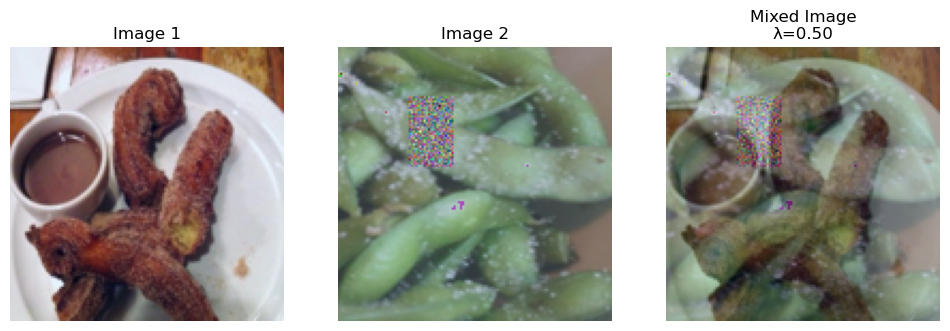

Label 1: churros, Label 2: edamame


In [46]:
def mixup_two_images(img1, img2, alpha=0.4):
    lam = np.random.beta(alpha, alpha)
    mixed_img = lam * img1 + (1 - lam) * img2
    return mixed_img, lam

# Get two transformed images
img1, label1 = dataset_train_transformed[0]
img2, label2 = dataset_train_transformed[30000]

# Convert to tensors and add batch dimension
img1 = img1.unsqueeze(0)
img2 = img2.unsqueeze(0)

# Apply Mixup
mixed_img, lam = mixup_two_images(img1, img2)

# Visualize
def show_mixup_images(img1, img2, mixed_img, label1, label2, lam):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    for ax, img, title in zip(axes, [img1, img2, mixed_img], ['Image 1', 'Image 2', f'Mixed Image\nλ={lam:.2f}']):
        img_np = img[0].permute(1, 2, 0).numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
        ax.imshow(img_np)
        ax.axis('off')
        ax.set_title(title)
    plt.show()
    print(f"Label 1: {class_names[label1]}, Label 2: {class_names[label2]}")

show_mixup_images(img1, img2, mixed_img, label1, label2, lam)


#### Testing with an image from the web


In [99]:
import torch
from torchvision import transforms
from PIL import Image
from timm.models import create_model

# Paths
image_path = "ToTest/ramen.jpg"
model_path = "checkpoints/transnext_base-42-epochs-Finetuned/best.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the checkpoint
checkpoint = torch.load(model_path, map_location=device)

# Load the args from the checkpoint
args = checkpoint['args']

# Create the model using the args from training
model = create_model(
    args.model,
    img_size=args.input_size,
    pretrain_size=args.pretrain_size,
    fixed_pool_size=args.fixed_pool_size,
    pretrained=False,
    num_classes=args.nb_classes,
    drop_rate=args.drop,
    drop_path_rate=args.drop_path,
    drop_block_rate=None,
)

# Load the model weights
model.load_state_dict(checkpoint['model'])
model.to(device)
model.eval()

# Define the transformations
transform = transforms.Compose([
    transforms.Resize((args.input_size, args.input_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load and preprocess the image
image = Image.open(image_path).convert("RGB")
input_tensor = transform(image).unsqueeze(0).to(device)

# Perform inference
with torch.no_grad():
    output = model(input_tensor)
    probabilities = torch.nn.functional.softmax(output[0], dim=0)
    predicted_class = probabilities.argmax().item()

# Map the predicted class index to its label
from torchvision.datasets import Food101

dataset = Food101(root=args.data_path, split='train')
class_names = dataset.classes
predicted_label = class_names[predicted_class]

print(f"Predicted Class Index: {predicted_class}")
print(f"Predicted Label: {predicted_label}")


C:\Users\Abdul-AzizAlNajjar\AppData\Local\Temp\ipykernel_231248\2790486067.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_locat

Predicted Class Index: 81
Predicted Label: ramen


## Heatmap of the model performance

In [8]:
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import Food101
from timm.models import create_model
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# Define transformations

transform = transforms.Compose([
    transforms.Resize((args.input_size, args.input_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load the test dataset
test_dataset = Food101(root=args.data_path, split='test', transform=transform)
test_loader = DataLoader(
    test_dataset,
    batch_size=32,  # Adjust batch size as per your memory constraints
    shuffle=False,
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
)


In [9]:
# Load the checkpoint
model_path = r"checkpoints\transnext_small\best.pth"
checkpoint = torch.load(model_path, map_location=device)

# Load the args from the checkpoint
args = checkpoint['args']

# Create the model using the args from training
model = create_model(
    args.model,
    img_size=args.input_size,
    pretrain_size=args.pretrain_size,
    fixed_pool_size=args.fixed_pool_size,
    pretrained=False,
    num_classes=args.nb_classes,
    drop_rate=args.drop,
    drop_path_rate=args.drop_path,
    drop_block_rate=None,
)

# Load the model weights
model.load_state_dict(checkpoint['model'])
model.to(device)
model.eval()

# Get class names
class_names = test_dataset.classes
num_classes = len(class_names)


C:\Users\Abdul-AzizAlNajjar\AppData\Local\Temp\ipykernel_27396\3873462001.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_locatio

In [11]:
import random
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm


all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images = images.to(device)
        labels = labels.to(device)
        
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


100%|██████████| 790/790 [03:57<00:00,  3.33it/s] 


In [12]:
cm = confusion_matrix(all_labels, all_preds, labels=range(num_classes))
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


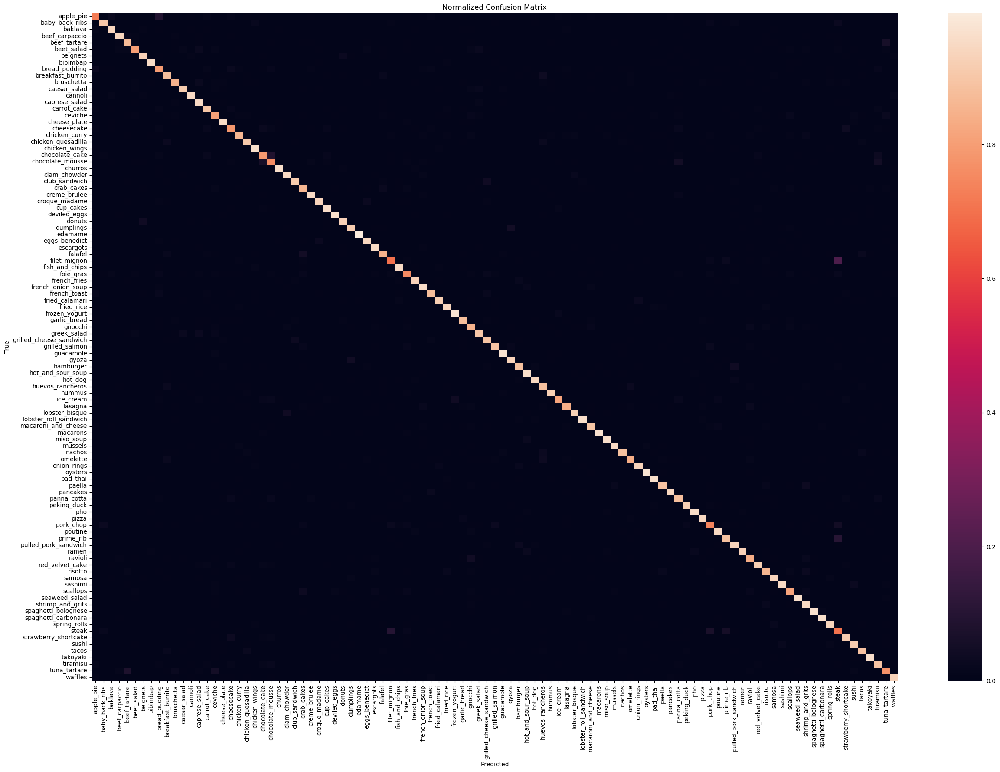

In [13]:
plt.figure(figsize=(30, 20))
sns.heatmap(cm_normalized, annot=False,  fmt='.2f',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Normalized Confusion Matrix')
plt.show()


#### Anlayzing the results

In [14]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)
lowest_accuracy_indices = np.argsort(class_accuracy)[:10]  # Get indices of 10 classes with lowest accuracy

print("Classes with lowest accuracy:")
for idx in lowest_accuracy_indices:
    print(f"{class_names[idx]}: {class_accuracy[idx]:.2f}")


Classes with lowest accuracy:
filet_mignon: 0.70
steak: 0.70
apple_pie: 0.72
pork_chop: 0.74
foie_gras: 0.76
chocolate_mousse: 0.76
tuna_tartare: 0.77
cheesecake: 0.78
chocolate_cake: 0.79
bread_pudding: 0.80


In [15]:
for idx in lowest_accuracy_indices:
    true_class = class_names[idx]
    cm_row = cm[idx]
    cm_row[idx] = 0  # Exclude correct predictions
    confused_idx = cm_row.argmax()
    confused_class = class_names[confused_idx]
    print(f"{true_class} is often confused with {confused_class}")


filet_mignon is often confused with steak
steak is often confused with filet_mignon
apple_pie is often confused with bread_pudding
pork_chop is often confused with steak
foie_gras is often confused with grilled_cheese_sandwich
chocolate_mousse is often confused with chocolate_cake
tuna_tartare is often confused with beef_tartare
cheesecake is often confused with strawberry_shortcake
chocolate_cake is often confused with chocolate_mousse
bread_pudding is often confused with apple_pie


  0%|          | 0/10 [00:00<?, ?it/s]

filet_mignon is often confused with steak


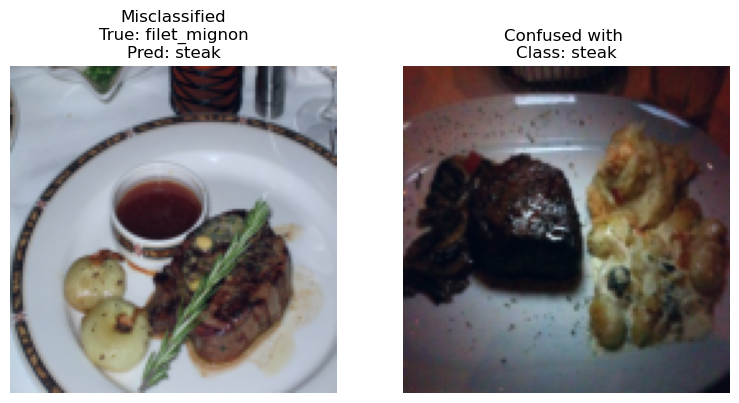

 10%|█         | 1/10 [00:00<00:02,  3.40it/s]

steak is often confused with filet_mignon


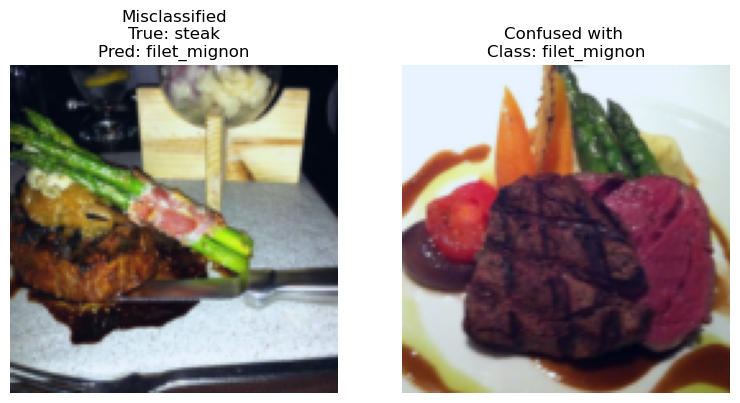

 20%|██        | 2/10 [00:00<00:02,  3.48it/s]

apple_pie is often confused with bread_pudding


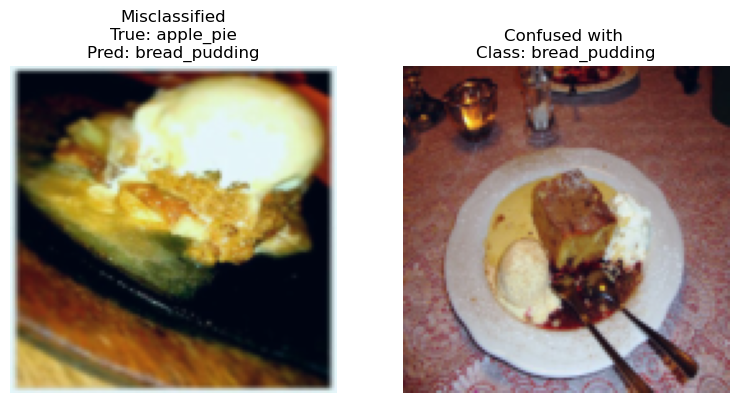

 30%|███       | 3/10 [00:00<00:02,  3.44it/s]

pork_chop is often confused with steak


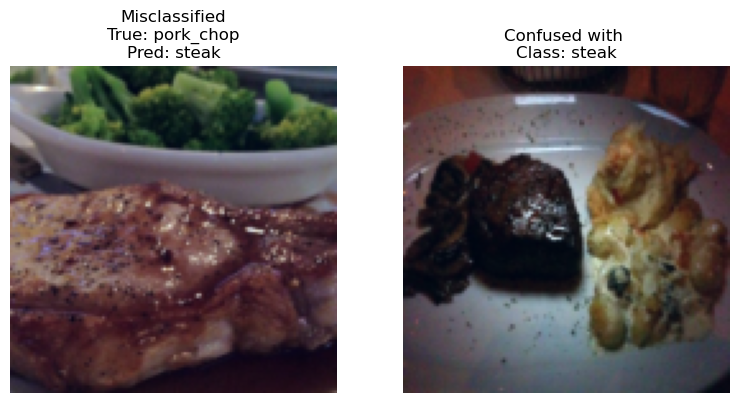

 40%|████      | 4/10 [00:01<00:01,  3.30it/s]

foie_gras is often confused with grilled_cheese_sandwich


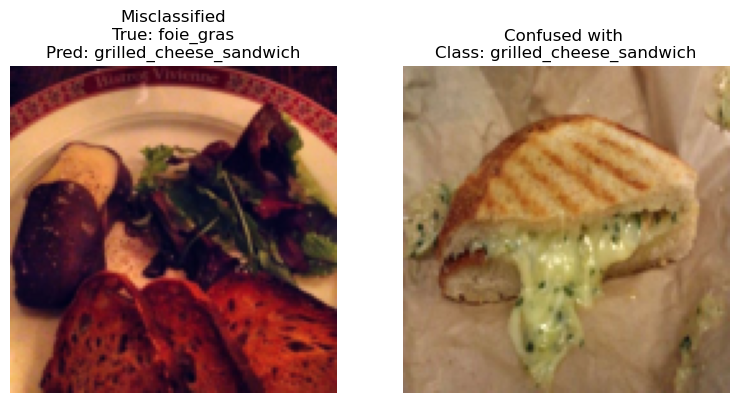

 50%|█████     | 5/10 [00:01<00:01,  3.01it/s]

chocolate_mousse is often confused with chocolate_cake


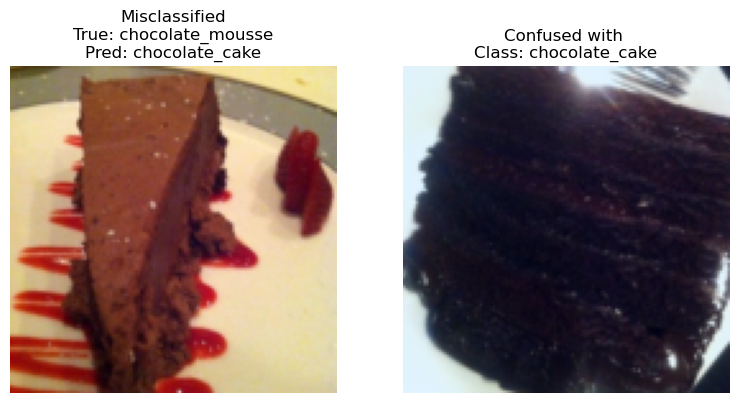

 60%|██████    | 6/10 [00:01<00:01,  3.01it/s]

tuna_tartare is often confused with beef_tartare


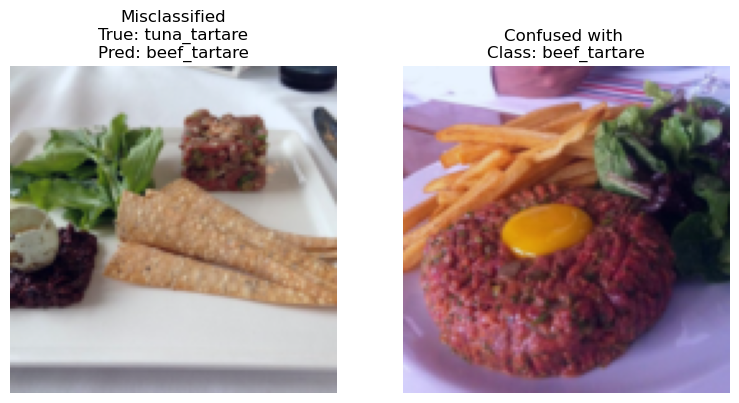

 70%|███████   | 7/10 [00:02<00:00,  3.13it/s]

cheesecake is often confused with strawberry_shortcake


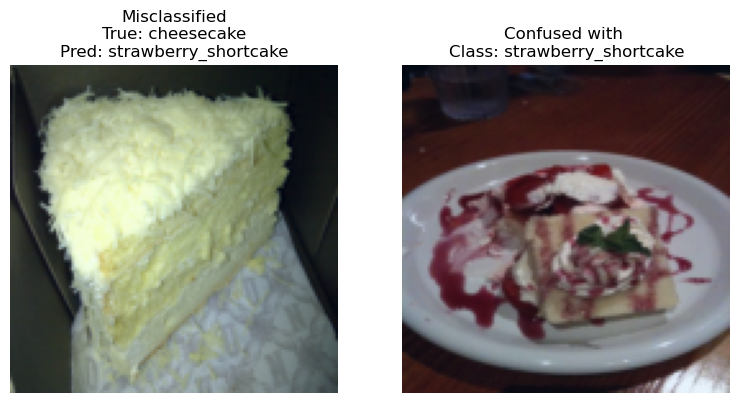

 80%|████████  | 8/10 [00:02<00:00,  3.16it/s]

chocolate_cake is often confused with chocolate_mousse


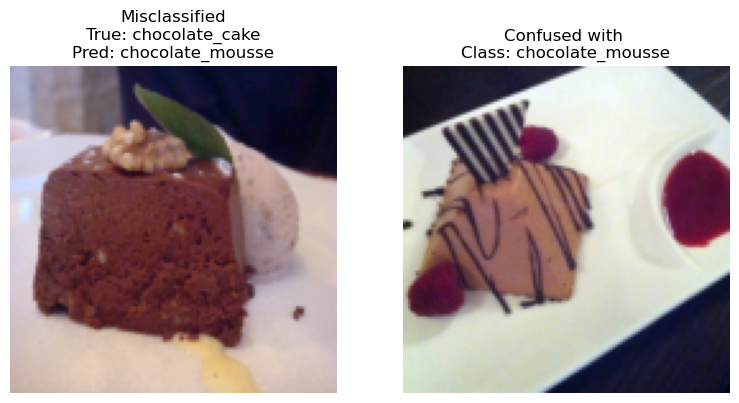

 90%|█████████ | 9/10 [00:02<00:00,  3.22it/s]

bread_pudding is often confused with apple_pie


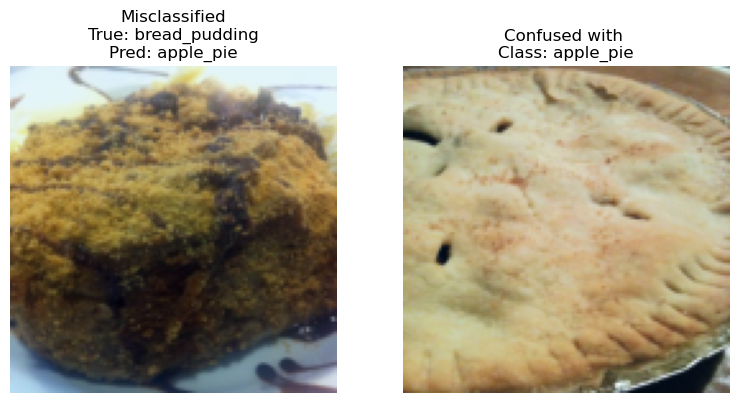

100%|██████████| 10/10 [00:03<00:00,  3.17it/s]


In [16]:

# Function to find a misclassified sample
def find_misclassified_sample(dataset, all_preds, all_labels, true_class_idx, confused_class_idx):
    """
    Finds a misclassified sample where the true label is `true_class_idx` but the predicted label is `confused_class_idx`.
    """
    for i in range(len(all_preds)):
        if all_labels[i] == true_class_idx and all_preds[i] == confused_class_idx:
            return dataset[i][0]  # Return the image
    return None  # If no such sample exists

# Function to convert and normalize images for display
def prepare_image_for_display(image):
    if isinstance(image, torch.Tensor):
        # If the image is a tensor, permute and normalize
        if image.dim() == 3:  # (C, H, W)
            image = image.permute(1, 2, 0)  # Convert to (H, W, C)
        image = image.numpy()
    elif isinstance(image, np.ndarray):
        # If the image is already a numpy array
        pass
    else:
        raise ValueError("Unsupported image type for visualization")
    
    # Normalize to [0, 1] for proper display
    image = (image - image.min()) / (image.max() - image.min())
    return image

# Iterate through the lowest accuracy indices
for idx in tqdm(lowest_accuracy_indices):
    true_class = class_names[idx]
    cm_row = cm[idx]
    cm_row[idx] = 0  # Exclude correct predictions
    confused_idx = cm_row.argmax()
    confused_class = class_names[confused_idx]
    
    print(f"{true_class} is often confused with {confused_class}")
    
    # Find a misclassified sample for the true class and its confused prediction
    misclassified_sample = find_misclassified_sample(test_dataset, all_preds, all_labels, idx, confused_idx)
    correct_sample = find_misclassified_sample(test_dataset, all_preds, all_labels, confused_idx, confused_idx)
    
    # Skip if no misclassified sample is found
    if misclassified_sample is None or correct_sample is None:
        print(f"Could not find misclassified or correct sample for {true_class} -> {confused_class}")
        continue

    # Plot the misclassified sample and a correct example
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    # Misclassified sample
    try:
        img_to_show = prepare_image_for_display(misclassified_sample)
        axes[0].imshow(img_to_show)
        axes[0].set_title(f"Misclassified\nTrue: {true_class}\nPred: {confused_class}")
        axes[0].axis("off")
    except ValueError as e:
        print(f"ValueError when processing misclassified sample: {e}")

    # Correct sample
    try:
        img_to_show = prepare_image_for_display(correct_sample)
        axes[1].imshow(img_to_show)
        axes[1].set_title(f"Confused with \nClass: {confused_class}")
        axes[1].axis("off")
    except ValueError as e:
        print(f"ValueError when processing correct sample: {e}")
    
    plt.tight_layout()
    plt.show()


In [150]:
test_dataset

Dataset Food101
    Number of datapoints: 25250
    Root location: Dataset/Food101
    split=test
    StandardTransform
Transform: Compose(
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [17]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)
highest_accuracy_indices = np.argsort(class_accuracy)[91:]  # Get indices of 10 classes with lowest accuracy

print("Classes with highest accuracy:")
for idx in highest_accuracy_indices:
    print(f"{class_names[idx]}: {class_accuracy[idx]:.2f}")

Classes with highest accuracy:
hot_and_sour_soup: 0.96
churros: 0.96
chicken_wings: 0.96
seaweed_salad: 0.96
spaghetti_bolognese: 0.97
macarons: 0.97
guacamole: 0.97
frozen_yogurt: 0.98
oysters: 0.98
edamame: 1.00


In [18]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)
highest_accuracy_indices = np.argsort(class_accuracy)[91:]  # Get indices of 10 classes with lowest accuracy

print("Classes with highest accuracy:")
for idx in highest_accuracy_indices:
    print(f"{class_names[idx]}: {class_accuracy[idx]:.2f}")

Classes with highest accuracy:
hot_and_sour_soup: 0.96
churros: 0.96
chicken_wings: 0.96
seaweed_salad: 0.96
spaghetti_bolognese: 0.97
macarons: 0.97
guacamole: 0.97
frozen_yogurt: 0.98
oysters: 0.98
edamame: 1.00


In [23]:
for idx in highest_accuracy_indices:
    true_class = class_names[idx]
    cm_row = cm[idx]
    cm_row[idx] = 0  # Exclude correct predictions
    confused_idx = cm_row.argmax()
    confused_class = class_names[confused_idx]
    print(f"{true_class} is often confused with {confused_class}")

hot_and_sour_soup is often confused with pho
churros is often confused with donuts
chicken_wings is often confused with fried_calamari
seaweed_salad is often confused with tuna_tartare
spaghetti_bolognese is often confused with spaghetti_carbonara
macarons is often confused with chocolate_cake
guacamole is often confused with ceviche
frozen_yogurt is often confused with ice_cream
oysters is often confused with falafel
edamame is often confused with seaweed_salad


  0%|          | 0/10 [00:00<?, ?it/s]

hot_and_sour_soup is often confused with pho


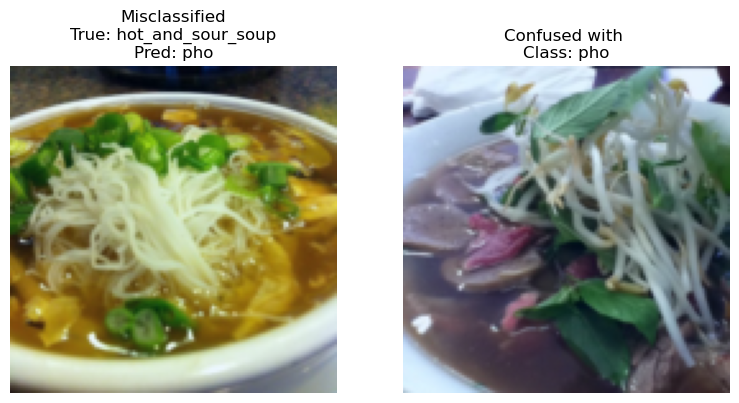

 10%|█         | 1/10 [00:00<00:02,  3.72it/s]

churros is often confused with donuts


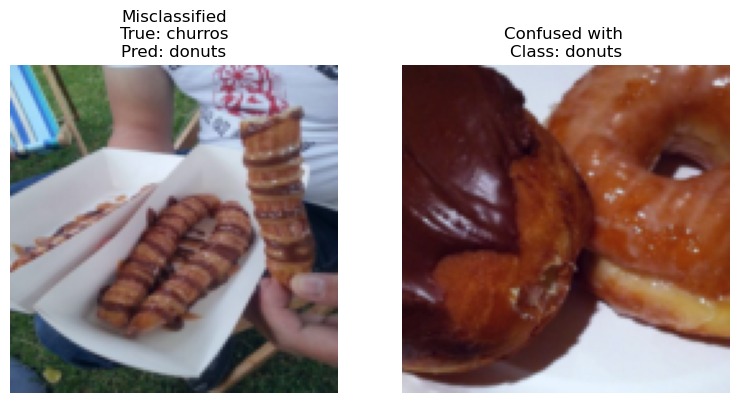

 20%|██        | 2/10 [00:00<00:02,  3.81it/s]

chicken_wings is often confused with fried_calamari


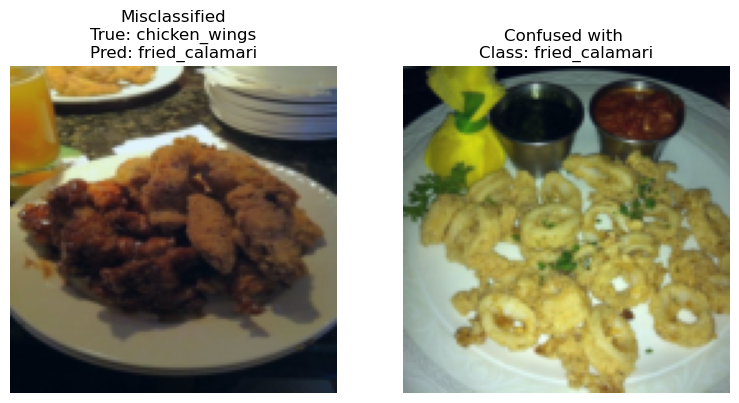

 30%|███       | 3/10 [00:00<00:01,  3.54it/s]

seaweed_salad is often confused with tuna_tartare


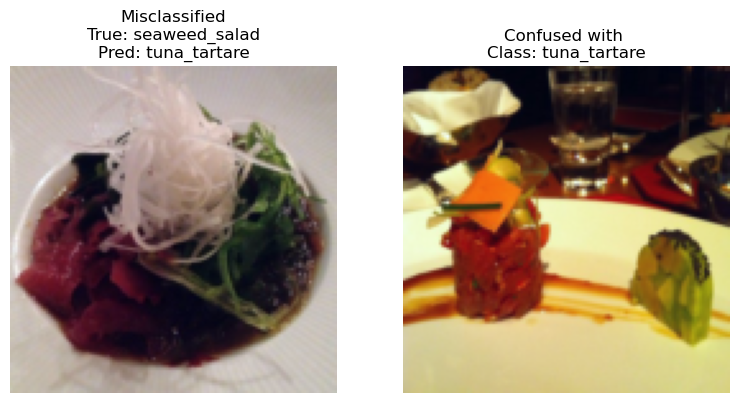

 40%|████      | 4/10 [00:01<00:01,  3.35it/s]

spaghetti_bolognese is often confused with spaghetti_carbonara


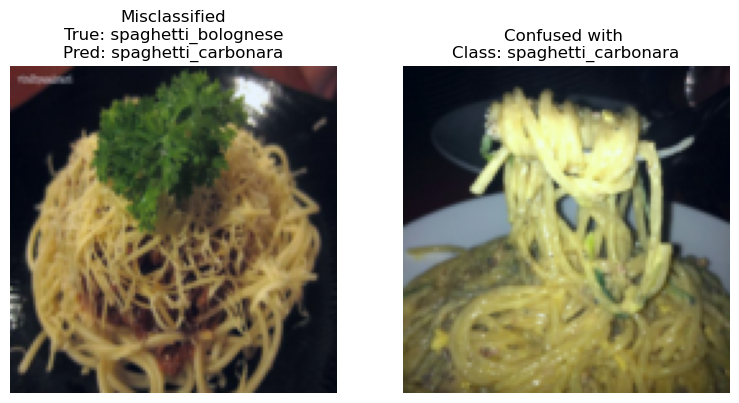

 50%|█████     | 5/10 [00:01<00:01,  3.46it/s]

macarons is often confused with chocolate_cake


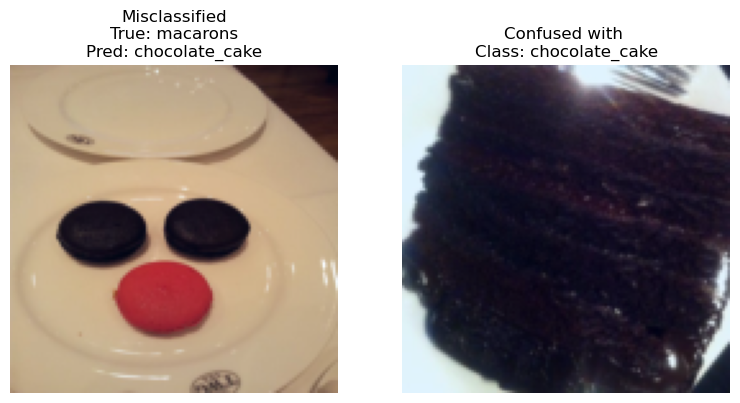

 60%|██████    | 6/10 [00:01<00:01,  3.66it/s]

guacamole is often confused with ceviche


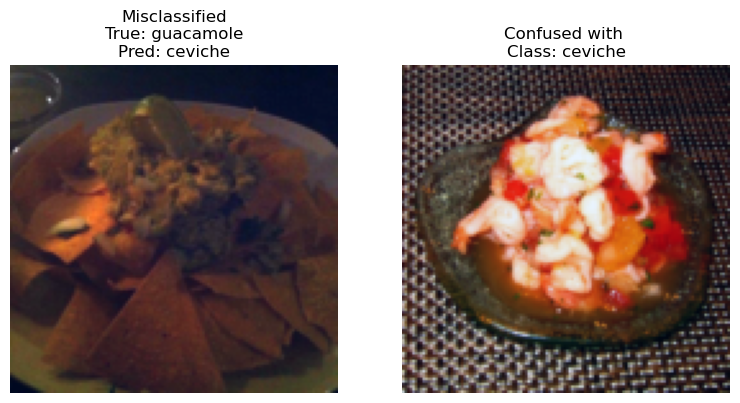

 70%|███████   | 7/10 [00:01<00:00,  3.67it/s]

frozen_yogurt is often confused with ice_cream


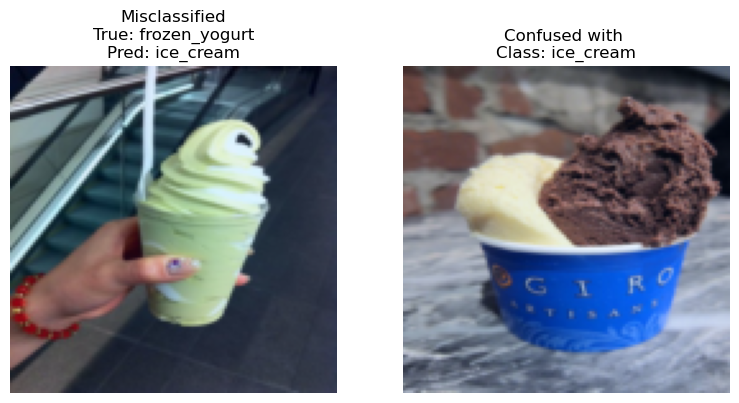

 80%|████████  | 8/10 [00:02<00:00,  3.67it/s]

oysters is often confused with falafel


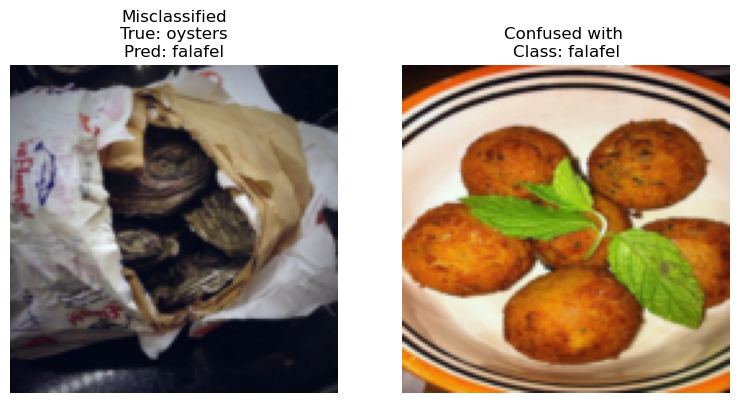

 90%|█████████ | 9/10 [00:02<00:00,  3.69it/s]

edamame is often confused with seaweed_salad


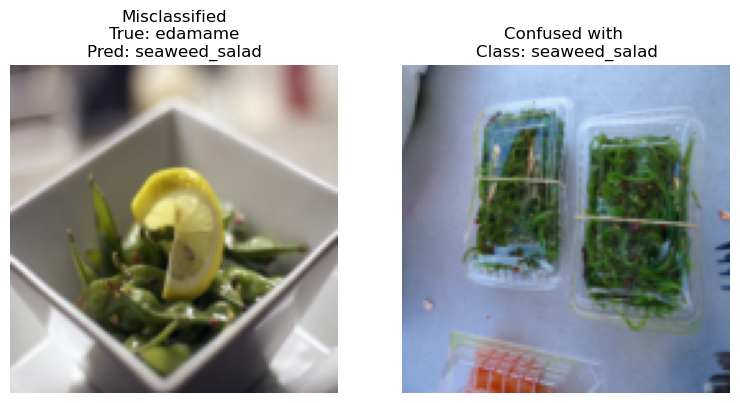

100%|██████████| 10/10 [00:02<00:00,  3.63it/s]


In [21]:

# Function to find a misclassified sample
def find_misclassified_sample(dataset, all_preds, all_labels, true_class_idx, confused_class_idx):
    """
    Finds a misclassified sample where the true label is `true_class_idx` but the predicted label is `confused_class_idx`.
    """
    for i in range(len(all_preds)):
        if all_labels[i] == true_class_idx and all_preds[i] == confused_class_idx:
            return dataset[i][0]  # Return the image
    return None  # If no such sample exists

# Function to convert and normalize images for display
def prepare_image_for_display(image):
    if isinstance(image, torch.Tensor):
        # If the image is a tensor, permute and normalize
        if image.dim() == 3:  # (C, H, W)
            image = image.permute(1, 2, 0)  # Convert to (H, W, C)
        image = image.numpy()
    elif isinstance(image, np.ndarray):
        # If the image is already a numpy array
        pass
    else:
        raise ValueError("Unsupported image type for visualization")
    
    # Normalize to [0, 1] for proper display
    image = (image - image.min()) / (image.max() - image.min())
    return image

# Iterate through the lowest accuracy indices
for idx in tqdm(highest_accuracy_indices):
    true_class = class_names[idx]
    cm_row = cm[idx]
    cm_row[idx] = 0  # Exclude correct predictions
    confused_idx = cm_row.argmax()
    confused_class = class_names[confused_idx]
    
    print(f"{true_class} is often confused with {confused_class}")
    
    # Find a misclassified sample for the true class and its confused prediction
    misclassified_sample = find_misclassified_sample(test_dataset, all_preds, all_labels, idx, confused_idx)
    correct_sample = find_misclassified_sample(test_dataset, all_preds, all_labels, confused_idx, confused_idx)
    
    # Skip if no misclassified sample is found
    if misclassified_sample is None or correct_sample is None:
        print(f"Could not find misclassified or correct sample for {true_class} -> {confused_class}")
        continue

    # Plot the misclassified sample and a correct example
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    # Misclassified sample
    try:
        img_to_show = prepare_image_for_display(misclassified_sample)
        axes[0].imshow(img_to_show)
        axes[0].set_title(f"Misclassified\nTrue: {true_class}\nPred: {confused_class}")
        axes[0].axis("off")
    except ValueError as e:
        print(f"ValueError when processing misclassified sample: {e}")

    # Correct sample
    try:
        img_to_show = prepare_image_for_display(correct_sample)
        axes[1].imshow(img_to_show)
        axes[1].set_title(f"Confused with \nClass: {confused_class}")
        axes[1].axis("off")
    except ValueError as e:
        print(f"ValueError when processing correct sample: {e}")
    
    plt.tight_layout()
    plt.show()
